# Coursework 2: Generative Models

## Setting up working environment

In [ ]:
!pip install -q torch torchvision altair matplotlib pandas
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
%load_ext google.colab.data_table

In [ ]:
from google.colab import drive
drive.mount('/content/drive') # Outputs will be saved in your google drive

Mounted at /content/drive


## Introduction
They are 2 parts:

1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part the MNIST dataset is needed https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 is needed (https://www.cs.toronto.edu/~kriz/cifar.html).

# Part 1 - Variational Autoencoder


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt
import pandas as pd


def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_VAE/')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE
###Hyper-parameter selection


In [ ]:
# Necessary Hyperparameters 
num_epochs = 300
learning_rate = 0.001
batch_size = 32
latent_dim = 100

# Additional Hyperparameters
input_size = 784    # The image size is 28x28 pixels
beta = 2
print_every = 100   # Used to print info during training


# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor()
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [ ]:
train_dat = datasets.MNIST(
    "data/", train=True, download=True, transform=transform
)
test_dat = datasets.MNIST("data/", train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>

In [ ]:
# Do you want a to use linear layers ? (False = Convolutionnal layers)
linear_layers = True

class VAE(nn.Module):
    def __init__(self, latent_dim):
        super(VAE, self).__init__()
        
        # Network with fully connected layers
        if linear_layers == True:        
            # encoder part
            self.fc1 = nn.Linear(input_size, 500)
            self.fc2 = nn.Linear(500, 250)
            self.fc31 = nn.Linear(250, latent_dim)
            self.fc32 = nn.Linear(250, latent_dim)
            # decoder part
            self.fc4 = nn.Linear(latent_dim, 250)
            self.fc5 = nn.Linear(250, 500)
            self.fc6 = nn.Linear(500, input_size)

        # Convolutionnal network
        else:
            # Encode
            self.econv1 = nn.Conv2d(in_channels=1, out_channels=8, kernel_size=4, stride=2, padding=1)
            self.b1 = nn.BatchNorm2d(8)
            self.econv2 = nn.Conv2d(in_channels=8, out_channels=16, kernel_size=4, stride=2, padding=1)
            self.b2 = nn.BatchNorm2d(16)
            self.econv3 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=4, stride=2, padding=1)
            self.b3 = nn.BatchNorm2d(32)
            self.econv4 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2, padding=1)
            self.b4 = nn.BatchNorm2d(64)
            self.efc1 = nn.Linear(64, 128)
            self.fc_mu = nn.Linear(128, latent_dim)
            self.fc_log_var = nn.Linear(128, latent_dim)
            self.dfc1 = nn.Linear(latent_dim, 64)

            # Decode
            self.dconv1 = nn.ConvTranspose2d(in_channels=64, out_channels=32, kernel_size=4, stride=1, padding=0)
            self.db1 = nn.BatchNorm2d(32)
            self.dconv2 = nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=4, stride=2, padding=1)
            self.db2 = nn.BatchNorm2d(16)
            self.dconv3 = nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=4, stride=2, padding=1)
            self.db3 = nn.BatchNorm2d(8)
            self.dconv4 = nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=4, stride=2, padding=3)


    def encode(self, x):

        # Encoding for fully connected network
        if linear_layers:
            h = F.relu(self.fc1(x))
            h = F.relu(self.fc2(h))
            out = self.fc31(h), self.fc32(h) # mu, log_var

        # Encoding for convolutionnal network
        else:
            x = self.econv1(x)
            x = self.b1(x)
            x = F.relu(x)
            x = self.econv2(x)
            x = self.b2(x)
            x = F.relu(x)
            x = self.econv3(x)
            x = self.b3(x)
            x = F.relu(x)
            x = self.econv4(x)
            x = self.b4(x)
            x = F.relu(x)

            batch, _, _, _ = x.shape
            x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
            x = self.efc1(x)

            mu = self.fc_mu(x)
            logvar = self.fc_log_var(x)

            out = mu, logvar


        return out
      

    def reparametrize(self, mu, logvar):

        # Compute standard deviation
        std = torch.exp(0.5*logvar)

        # Create tensor with the same size as input
        # Filled with normal distribution of Mean 0 and Variance 1        
        eps = torch.randn_like(std)

        return mu + eps*std


    def decode(self, z):

        if linear_layers == True:
            h = F.relu(self.fc4(z))
            h = F.relu(self.fc5(h))
            out = F.sigmoid(self.fc6(h))

        else:
            z = self.dfc1(z)
            z = z.view(-1, 64, 1, 1)
            z = self.dconv1(z)
            z = self.db1(z)
            z = F.relu(z)
            z = self.dconv2(z)
            z = self.db2(z)
            z = F.relu(z)
            z = self.dconv3(z)
            z = self.db3(z)
            z = F.relu(z)
            out = F.sigmoid(self.dconv4(z))

        return out


    def forward(self, x):
        if linear_layers:
            mu, logvar = self.encode(x.view(-1, 784))

        else:
            mu, logvar = self.encode(x)

        z = self.reparametrize(mu, logvar)
        return self.decode(z), mu, logvar


model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 1111484
VAE(
  (fc1): Linear(in_features=784, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=250, bias=True)
  (fc31): Linear(in_features=250, out_features=100, bias=True)
  (fc32): Linear(in_features=250, out_features=100, bias=True)
  (fc4): Linear(in_features=100, out_features=250, bias=True)
  (fc5): Linear(in_features=250, out_features=500, bias=True)
  (fc6): Linear(in_features=500, out_features=784, bias=True)
)


--- 

## Part 1.1b: Training the Model

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In [ ]:
# Defining the loss function
def loss_function_VAE(recon_x, x, mu, logvar, beta):
    if linear_layers:
        BCE = F.binary_cross_entropy(recon_x, x.view(-1, 784), reduction='sum')
    else:
        BCE = F.binary_cross_entropy(recon_x, x, reduction='sum')

    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())
    return BCE + beta*KLD, BCE, KLD


################################################################################
################################################################################


# Lists to store the loss values
loss_values = []
bce_loss_values = []
kl_loss_values = []
test_loss_values = []
test_bce_loss_values = []
test_kl_loss_values = []

model.train()

# Loop over the epochs
for epoch in range(num_epochs):

        # Initialise the losses of the epoch        
        running_loss = 0
        running_bce = 0
        running_kl = 0
        running_test_loss = 0
        running_test_bce = 0
        running_test_kl = 0

        # Train
        for batch_idx, (data, _) in enumerate(loader_train):
            data = data.to(device)

            # Zero out all of the gradients for the variables which the optimizer will update.
            optimizer.zero_grad()
            
            # Forward pass
            recon_batch, mu, log_var = model(data)

            # Compute the loss
            loss, bce, kl = loss_function_VAE(recon_batch, data, mu, log_var, beta)            
            loss.backward()

            # Keep loss in memory
            running_loss += loss.item()
            running_bce += bce.item()
            running_kl += kl.item()

            # Update the parameters of the model using the gradients
            optimizer.step()
            
            if batch_idx % print_every == 0:
                  print('Epoch: %d, Iteration %d, loss = %.4f' % (epoch, batch_idx, loss.item()))
                  print()


        # Evaluate on test set :
        for batch_idx, (data, _) in enumerate(loader_test):
            data = data.to(device)
            optimizer.zero_grad()
            recon_batch, mu, log_var = model(data)

            # Compute the loss
            loss, bce, kl = loss_function_VAE(recon_batch, data, mu, log_var, beta)
            running_test_loss += loss.item()
            running_test_bce += bce.item()
            running_test_kl += kl.item()
                
                
        # Store the loss values to plot
        loss_values.append(running_loss / len(loader_train.dataset))
        bce_loss_values.append(running_bce / len(loader_train.dataset))
        kl_loss_values.append(running_kl / len(loader_train.dataset))

        test_loss_values.append(running_test_loss / len(loader_test.dataset))
        test_bce_loss_values.append(running_test_bce / len(loader_test.dataset))
        test_kl_loss_values.append(running_test_kl / len(loader_test.dataset))

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # save the model
        if epoch == num_epochs - 1:
            with torch.no_grad():
                torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                    '/content/drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Streaming output truncated to the last 5000 lines.
Epoch: 168, Iteration 800, loss = 3685.0479

Epoch: 168, Iteration 900, loss = 4164.7861

Epoch: 168, Iteration 1000, loss = 3768.9614

Epoch: 168, Iteration 1100, loss = 3603.9021

Epoch: 168, Iteration 1200, loss = 3331.4219

Epoch: 168, Iteration 1300, loss = 3911.4155

Epoch: 168, Iteration 1400, loss = 3769.1758

Epoch: 168, Iteration 1500, loss = 3657.8865

Epoch: 168, Iteration 1600, loss = 3837.5837

Epoch: 168, Iteration 1700, loss = 4123.9014

Epoch: 168, Iteration 1800, loss = 3861.6462

Epoch: 169, Iteration 0, loss = 3842.3113

Epoch: 169, Iteration 100, loss = 3634.7139

Epoch: 169, Iteration 200, loss = 3696.0430

Epoch: 169, Iteration 300, loss = 3932.3623

Epoch: 169, Iteration 400, loss = 3862.6162

Epoch: 169, Iteration 500, loss = 3744.5845

Epoch: 169, Iteration 600, loss = 4022.1592

Epoch: 169, Iteration 700, loss = 3980.9351

Epoch: 169, Iteration 800, loss = 3754.7253

Epoch: 169, Iteration 900, loss = 3793.855

### Loss Explanation



In [ ]:
# Binary Cross Entropy
BCE = F.binary_cross_entropy(recon_x, x.view(-1, 784), reduction='sum')
        
# Kullback Leibler : 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
DKL = 0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

# The Loss is :
LOSS = BCE - beta * DKL

The images are black & white images so we can model the observations as multivariate **Bernoulli random variables**. Then, using the Maximum Likelihood Estimation on the Bernoulli distribution is the same as using the Binary Cross Entropy (BCE) loss. A proof can be found here : https://towardsdatascience.com/where-did-the-binary-cross-entropy-loss-function-come-from-ac3de349a715


I have tested the MSE loss and the results are indeed worse than using the BCE.

---

**Output Data domain :**

As the decoder has to have values between 0 and 1 (Bernoulli distribution), I have used a sigmoid activation at the output of the decoder to force the output datas to be in [0,1]. The sigmoid activation function is show on the plot below :

![sigmoid](https://miro.medium.com/max/485/1*Xu7B5y9gp0iL5ooBj7LtWw.png)

---

**Disentanglement in the latent space :**

The β parameter in front of the KL loss is used to amplify or decrease the impact of the KL term. It it used to balance the importance of the gradients from the reconstruction and the prior matching.
A high β (β > 1) is needed to achieve a good disentanglement in the latent space.


<h2>Part 1.2

## Part 1.2a: Loss Curves


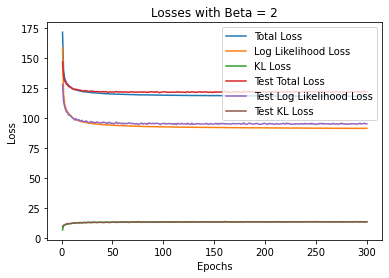

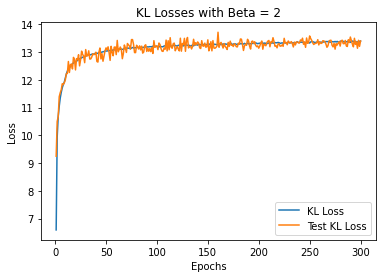

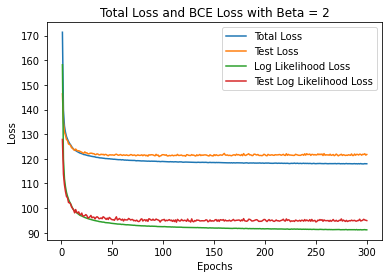

In [ ]:
X = np.arange(1, num_epochs + 1)
plt.plot(X, loss_values, label='Total Loss')
plt.plot(X, bce_loss_values, label='Log Likelihood Loss')
plt.plot(X, kl_loss_values, label='KL Loss')
plt.plot(X, test_loss_values, label='Test Total Loss')
plt.plot(X, test_bce_loss_values, label='Test Log Likelihood Loss')
plt.plot(X, test_kl_loss_values, label='Test KL Loss')
plt.legend()
plt.title("Losses with Beta = 2")
plt.xlabel("Epochs")
plt.ylabel('Loss')
plt.savefig("VAE_FC_BETA_2")
plt.show()

plt.clf()
plt.plot(X, kl_loss_values, label='KL Loss')
plt.plot(X, test_kl_loss_values, label='Test KL Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("KL Losses with Beta = 2")
plt.legend()
plt.savefig("VAE_FC_BETA_2_KL")
plt.show()

plt.clf()
plt.plot(X, loss_values, label='Total Loss')
plt.plot(X, test_loss_values, label='Test Loss')
plt.plot(X, bce_loss_values, label='Log Likelihood Loss')
plt.plot(X, test_bce_loss_values, label='Test Log Likelihood Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Total Loss and BCE Loss with Beta = 2")
plt.legend()
plt.savefig("VAE_FC_BETA_2_LOSS_BCE")
plt.show()

I have computed the losses for different values of beta to compare the results :

![VAE_Fc_BETA_0](https://drive.google.com/uc?export=view&id=11nL_eBE_Wr9SdPMikh3PKcvT1lVvRr_n)
![VAE_Fc_BETA_0](https://drive.google.com/uc?export=view&id=14KOOZUsgyM1DWazgXczQcHS1y5IBPLDV)
![VAE_Fc_BETA_0](https://drive.google.com/uc?export=view&id=1bIPlcNunZbctSEurxOEFMwQtBK2YrtWI)

In [ ]:
beta_0_loss = []
beta_0_kl = []
beta_0_bce = []
for k in range(len(test_loss_values)):
    beta_0_loss.append(test_loss_values[k])
    beta_0_kl.append(test_kl_loss_values[k])
    beta_0_bce.append(test_bce_loss_values[k])

In [ ]:
beta_05_loss = []
beta_05_kl = []
beta_05_bce = []
for k in range(len(test_loss_values)):
    beta_05_loss.append(test_loss_values[k])
    beta_05_kl.append(test_kl_loss_values[k])
    beta_05_bce.append(test_bce_loss_values[k])

In [ ]:
beta_1_loss = []
beta_1_kl = []
beta_1_bce = []
for k in range(len(test_loss_values)):
    beta_1_loss.append(test_loss_values[k])
    beta_1_kl.append(test_kl_loss_values[k])
    beta_1_bce.append(test_bce_loss_values[k])

In [ ]:
beta_5_loss = []
beta_5_kl = []
beta_5_bce = []
for k in range(len(test_loss_values)):
    beta_5_loss.append(test_loss_values[k])
    beta_5_kl.append(test_kl_loss_values[k])
    beta_5_bce.append(test_bce_loss_values[k])

In [ ]:
plt.clf()
plt.plot(X, beta_0_loss, label='Beta = 0')
plt.plot(X, beta_05_loss, label='Beta = 0.5')
plt.plot(X, beta_1_loss, label='Beta = 1')
plt.plot(X, beta_5_loss, label='Beta = 5')
plt.title("Total Loss for different values of beta")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.savefig('beta_comparison')
plt.show()

plt.clf()
plt.plot(X, beta_0_kl, label='Beta = 0')
plt.plot(X, beta_05_kl, label='Beta = 0.5')
plt.plot(X, beta_1_kl, label='Beta = 1')
plt.plot(X, beta_5_kl, label='Beta = 5')
plt.title("KL Loss for different values of beta")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.savefig('beta_comparison_kl')
plt.show()

plt.clf()
plt.plot(X, beta_0_bce, label='Beta = 0')
plt.plot(X, beta_05_bce, label='Beta = 0.5')
plt.plot(X, beta_1_bce, label='Beta = 1')
plt.plot(X, beta_5_bce, label='Beta = 5')
plt.title("BCE Loss for different values of beta")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.savefig('beta_comparison_bce')
plt.show()

## Part 1.2b: Samples and Reconstructions
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples.

Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


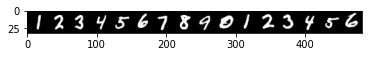

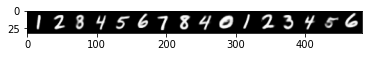

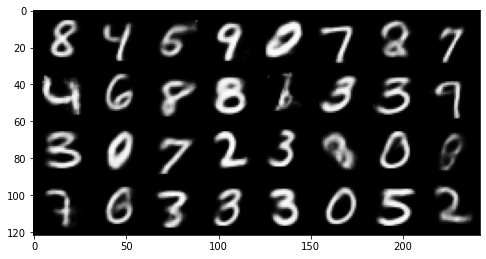

In [ ]:
# load the model
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]


# Because of gpu errors I had to do it that way to select the last batch of the loader
for batch_idx, (data, label) in enumerate(loader_test):
      fixed_input = data.to(device=device, dtype=torch.float32)  # move to device, e.g. GPU


# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=16, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
 
    
    # This way does not work
    sample_inputs.to(device=device, dtype=torch.float32)

    # Compute the reconstruction of the last batch with our trained model
    recon_batch, mu, logvar = model(fixed_input)
    recon_batch = recon_batch.reshape(16, 1, 28, 28)

    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 32
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():

    samples = model.decode(z)
    samples = samples.reshape(n_samples, 1, 28, 28)

    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)



For both fully connected and convolutional layers, the **log-likelihood loss (BCE Loss) is decreasing** before stabilisation. On the contrary, the **KL loss is increasing** before stabilisation.

The behaviour is desirable as the KL term is used to balance the gradients of reconstruction and the prior-matching component of the lower bound.

---

I have observed posterior collapse during training and because of it, it was hard to distinguish between numbers on the reconstruction. For exemple the 6 and the 8 were pretty similar. Sometimes the 6 and the 8 were always reconstruct as 8.
What I did to avoid it, is that I have increased the number of neurons on the latent space: less than 10 is not enough and I had good results with a latent dimension of 100. I have also increased the number of layers (3 for encoding and 3 for decoding).

---

First I have implemented the fully connected network and then the convolutionnal network but I had a better image generation using the first one.

---
<h2> Part 1.3 <h2/>

Qualitative analysis of the learned representations

In [ ]:
from sklearn.manifold import TSNE

digits_representation = []
labels_list = []
# Because of gpu errors I had to do it that way to select the last batch of the loader
for batch_idx, (data, label) in enumerate(loader_test):
      data = data.to(device=device, dtype=torch.float32)  # move to device, e.g. GPU
      if linear_layers:
          data = data.view(data.size(0), -1)
      encoded_mean, encoded_logvar = model.encode(data)
      reparametrized = model.reparametrize(encoded_mean, encoded_logvar)
      for tensor in reparametrized:
          tensor = tensor.cpu()
          digits_representation.append(tensor.detach().numpy())
      
      # Keep the label for the matplotlib plot
      for k in label:
          labels_list.append(k.item())

# Compute TSNE
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(digits_representation)




[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.019s...
[t-SNE] Computed neighbors for 10000 samples in 5.437s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.285976
[t-SNE] KL divergence after 50 iterations with early exaggeration: 92.510750
[t-SNE] KL divergence after 300 iterations: 4.061876


In [ ]:
# This also works but without the matplotlib plot
from sklearn.manifold import TSNE
loader_test = DataLoader(test_dat, 10000, shuffle=False)

sample_inputs, labels = next(iter(test_dataloader))
with torch.no_grad():
    mu, var = model.encode(sample_inputs.to(device).view(-1, 784))
    z = model.reparametrize(mu, var)
    z = z.cpu()

tsne_results = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300).fit_transform(z)


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.024s...
[t-SNE] Computed neighbors for 10000 samples in 5.371s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.289912
[t-SNE] KL divergence after 50 iterations with early exaggeration: 92.541473
[t-SNE] KL divergence after 300 iterations: 4.119299


In [ ]:
# Interactive Visualization
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
#plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)
plot_tsne(tsne_results, test_dataloader, num_points=1000, darkmode=False)



alt.HConcatChart(...)

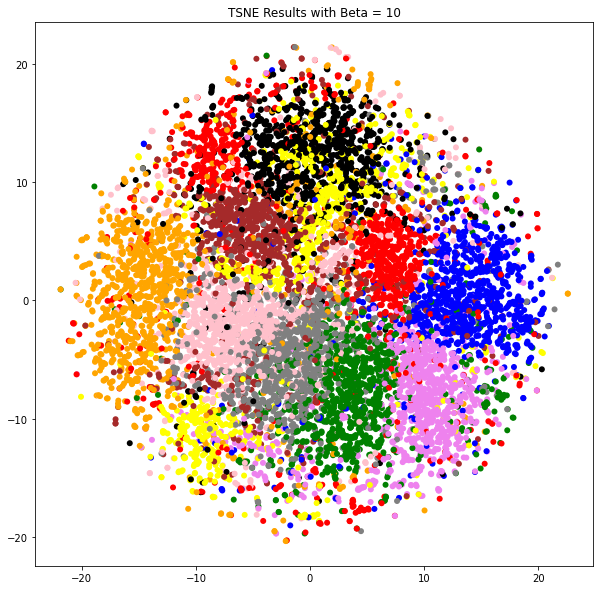

In [ ]:
colors = []
for digit in labels_list:
    if digit == 0:
        color = 'blue'
    elif digit == 1:
        color = 'orange'
    elif digit == 2:
        color = 'red'
    elif digit == 3:
        color = 'black'
    elif digit == 4:
        color = 'green'
    elif digit == 5:
        color = 'yellow'
    elif digit == 6:
        color = 'violet'
    elif digit == 7:
        color = 'pink'
    elif digit == 8:
        color = 'brown'
    elif digit == 9:
        color = 'grey'
    colors.append(color)

# Custom Visualizations
X = tsne_results[:,0]
Y = tsne_results[:,1]

plt.figure(figsize=(10, 10))
plt.scatter(X, Y, color=colors, linewidths=0)
plt.title('TSNE Results with Beta = 10')
plt.savefig('TSNE_Beta_10')
plt.show()

We can oberve that the digits are gathered in clusters (see above). Some clusters are far from each other because the digits that they represent are distinct and the model has learnt how to distinguish them during projection (e.g the 0 is very different from the 1). And some are next to each other and even overlap because the digits are similar : the model try to separate the classes but the projection is approximative (e.g the 4 is similar to the 9). Which means that those numbers will be hard to reconstruct properly and there will be mode collapse.

---

I have plotted the T-SNE for different values of beta :

![VAE_Fc_BETA_01](https://drive.google.com/uc?export=view&id=1iOK0RftayOJQOyZFyOP_Rkm_JKRyFoYd)
![VAE_Fc_BETA_05](https://drive.google.com/uc?export=view&id=1UEw5tWaX6vAA8UbqjD8lIsqnfaBKOg2A)
![VAE_Fc_BETA_1](https://drive.google.com/uc?export=view&id=1AEPOC-YsDdwXa12LZ0covVM_QsTbK9_a)
![VAE_Fc_BETA_10](https://drive.google.com/uc?export=view&id=1G846B7Z6os-fFogRnp6eaoVCfL7x2nLk)

For small values of beta, the clusters are distinct, the boundaries are quite visible and large. But as beta increases, the boundaries starts to became thiner and for Beta = 10, it would be hard to distinguish the clusters if they had the same color.


T-SNE is considered as very reliable and flexible. But sometimes if the latent space has a huge dimension, the T-SNE struggles to plot a representation.
![VAE_Fc_BETA_fail](https://drive.google.com/uc?export=view&id=1dC7D6xEe0s94r2jYvqbGo0eCCkkENur2)


## Part 1.3b: Interpolating in $z$
Linear interpolation in the latent space of the autoencoder


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1639: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


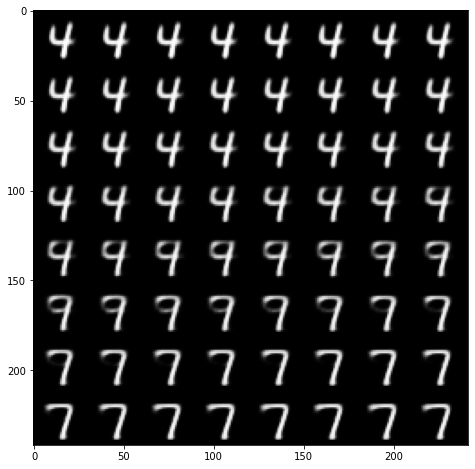

In [ ]:
for batch_idx, (data, label) in enumerate(loader_test):
      data = data.to(device=device, dtype=torch.float32)  # move to device, e.g. GPU
      if batch_idx == 1:
          input_one = data[10]
          input_six = data[4]

with torch.no_grad():
    mu, logvar = model.encode(input_one.view(1, 784))
    representation_one = model.reparametrize(mu, logvar)
    mu, logvar = model.encode(input_six.view(1, 784))
    representation_six = model.reparametrize(mu, logvar)

    interpol = representation_one
    for t in range(1, 64):
        interpol = torch.cat((interpol, representation_one + (t/64) * (representation_six - representation_one)), 0)

    reconstruction = model.decode(interpol).view(64, 1, 28, 28)

    reconstruction = reconstruction.cpu()
    reconstruction = make_grid(denorm(reconstruction), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(reconstruction)


As in the TSNE plot, the clusters of 4s and 7s are separate. And as the cluster of 9s is in between, I expect to see some 9s in the middle while interpolating the 4s and the 7s. That is what you can see on the above plot.

# Part 2 - Deep Convolutional GAN

Train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset.

## Part 2.1


In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt


def denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists('/content/drive/MyDrive/icl_dl_cw2/CW_GAN'):
    os.makedirs('/content/drive/MyDrive/icl_dl_cw2/CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cpu


### Part 2.1a: Implementation of DCGAN


#### Data loading

In [ ]:
batch_size = 128 #

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5),),                        
])

data_dir = './datasets'

cifar10_train = datasets.CIFAR10(data_dir, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_dir, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Extracting ./datasets/cifar-10-python.tar.gz to ./datasets
Files already downloaded and verified


We'll visualize a subset of the test set: 

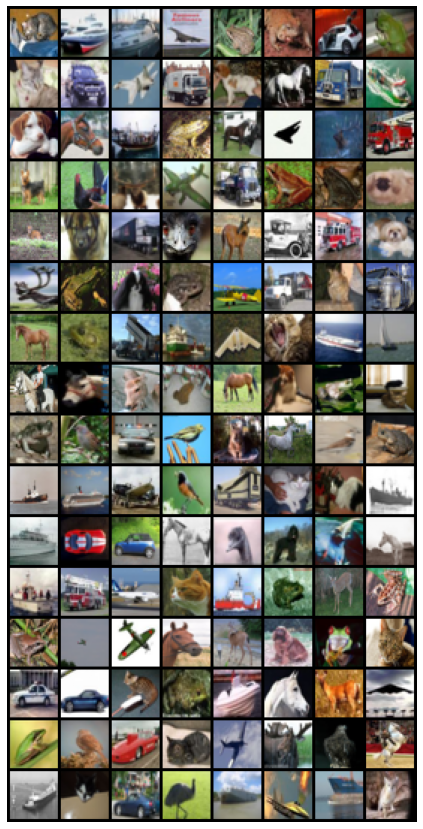

In [ ]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [ ]:
# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 100
learning_rate = 0.0002
latent_vector_size = 100

# Other hyperparams
# Size of feature maps in generator
size_feature_map_generator = 64

# Size of feature maps in discriminator
size_feature_map_discriminator = 64


In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
            self.network = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_vector_size, size_feature_map_generator * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(size_feature_map_generator * 8),
            nn.ReLU(True),

            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(size_feature_map_generator * 8, size_feature_map_generator * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(size_feature_map_generator * 4),
            nn.ReLU(True),

            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(size_feature_map_generator * 4, size_feature_map_generator * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(size_feature_map_generator * 2),
            nn.ReLU(True),

            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(size_feature_map_generator * 2, 3, 4, 2, 1, bias=False),
            #nn.BatchNorm2d(size_feature_map_generator),
            #nn.ReLU(True),

            # state size. (ngf) x 32 x 32
            #nn.ConvTranspose2d(size_feature_map_generator, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. 3 x 64 x 64
        )
 


    def forward(self, z):

        out = self.network(z)
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.network = nn.Sequential(
            
            # Size 3 x 32 x 32 --> 64 x 16 x 16
            nn.Conv2d(3, size_feature_map_discriminator, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # Size 64 x 16 x 16 --> 128 x 8 x 8
            nn.Conv2d(size_feature_map_discriminator, size_feature_map_discriminator * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(size_feature_map_discriminator * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # Size 128 x 8 x 8 --> 256 x 4 x 4
            nn.Conv2d(size_feature_map_discriminator * 2, size_feature_map_discriminator * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(size_feature_map_discriminator * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # Size 256 x 8 x 8 --> 512 x 4 x 4
            #nn.Conv2d(size_feature_map_discriminator * 4, size_feature_map_discriminator * 8, 4, 2, 1, bias=False),
            #nn.BatchNorm2d(size_feature_map_discriminator * 8),
            #nn.LeakyReLU(0.2, inplace=True),

            # Size 512 x 4 x 4 --> 1 : the probility of beeing in the dataset
            #nn.Conv2d(size_feature_map_discriminator * 8, 1, 4, 1, 0, bias=False),
            #nn.Sigmoid()

            # Size 256 x 4 x 4 --> 1 : the probility of beeing in the dataset
            nn.Conv2d(size_feature_map_discriminator * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
 
        
    def forward(self, x):
        out = self.network(x)  
        return out


<h2> Initialize Model and print number of parameters </h2>

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3448576
Generator(
  (network): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 663296
Discriminator(
  (network): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), paddin

### Part 2.1b: Training the Model

#### Defining a Loss

In [ ]:
def loss_function(out, label):
    loss = nn.BCELoss()
    return loss(out, label)

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
real_label = 1
fake_label = 0

#### Training Loop

In [ ]:
train_losses_G = []
train_losses_D = []

for epoch in range(num_epochs):
    train_loss_D = 0
    train_loss_G = 0
    for i, data in enumerate(loader_train, 0):

        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ############################
        #real_label = np.random.random_integers(900 + 100 * epoch/100, 1000) / 1000
        #fake_label = np.random.random_integers(0, 100 - 100 * epoch/100) / 1000
        
        
        # Train with real images
        model_D.zero_grad()

        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Pass the batch through D
        output = model_D(real_cpu).view(-1)
        # Loss calculation
        error_D_real = loss_function(output, label)
        # Gradients computation
        error_D_real.backward()
        D_x = output.mean().item()

        # Train with fake images
        # Random latent vectors
        noise = torch.randn(b_size, latent_vector_size, 1, 1, device=device)
        # Construct/generate fake images using G
        fake = model_G(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = model_D(fake.detach()).view(-1)
        # Loss calculation with the fake batch
        error_D_fake = loss_function(output, label)
        # Gradients computation
        error_D_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients : real and fake
        errD = error_D_fake + error_D_real
        # Update D
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()
        label.fill_(real_label)
        # The fake batches go through D
        output = model_D(fake).view(-1)
        # G loss computation
        errG = loss_function(output, label)
        # Gradients computation
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        train_loss_D += errD.item()
        train_loss_G += errG.item()

        print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
              % (epoch, num_epochs, i, len(loader_train),
                 errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/fake_samples_epoch_%03d.png' % epoch)

    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
   
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), '/content/drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')



[0/100][0/391] Loss_D: 1.2859 Loss_G: 2.2099 D(x): 0.5034 D(G(z)): 0.3955 / 0.1261
[0/100][1/391] Loss_D: 2.0625 Loss_G: 1.5235 D(x): 0.6578 D(G(z)): 0.7667 / 0.2470
[0/100][2/391] Loss_D: 2.4059 Loss_G: 1.5647 D(x): 0.5984 D(G(z)): 0.8095 / 0.2393
[0/100][3/391] Loss_D: 2.4263 Loss_G: 1.7890 D(x): 0.5449 D(G(z)): 0.7914 / 0.1931
[0/100][4/391] Loss_D: 2.3850 Loss_G: 2.0101 D(x): 0.4976 D(G(z)): 0.7650 / 0.1553
[0/100][5/391] Loss_D: 2.6892 Loss_G: 2.0736 D(x): 0.4674 D(G(z)): 0.8081 / 0.1455
[0/100][6/391] Loss_D: 2.7606 Loss_G: 2.3448 D(x): 0.4373 D(G(z)): 0.8183 / 0.1114
[0/100][7/391] Loss_D: 2.7638 Loss_G: 2.7917 D(x): 0.3925 D(G(z)): 0.7877 / 0.0712
[0/100][8/391] Loss_D: 2.3980 Loss_G: 3.1801 D(x): 0.4536 D(G(z)): 0.7462 / 0.0502
[0/100][9/391] Loss_D: 2.0078 Loss_G: 3.5779 D(x): 0.4337 D(G(z)): 0.6144 / 0.0329


KeyboardInterrupt: ignored

## Part 2.1c: Results


### Generator samples

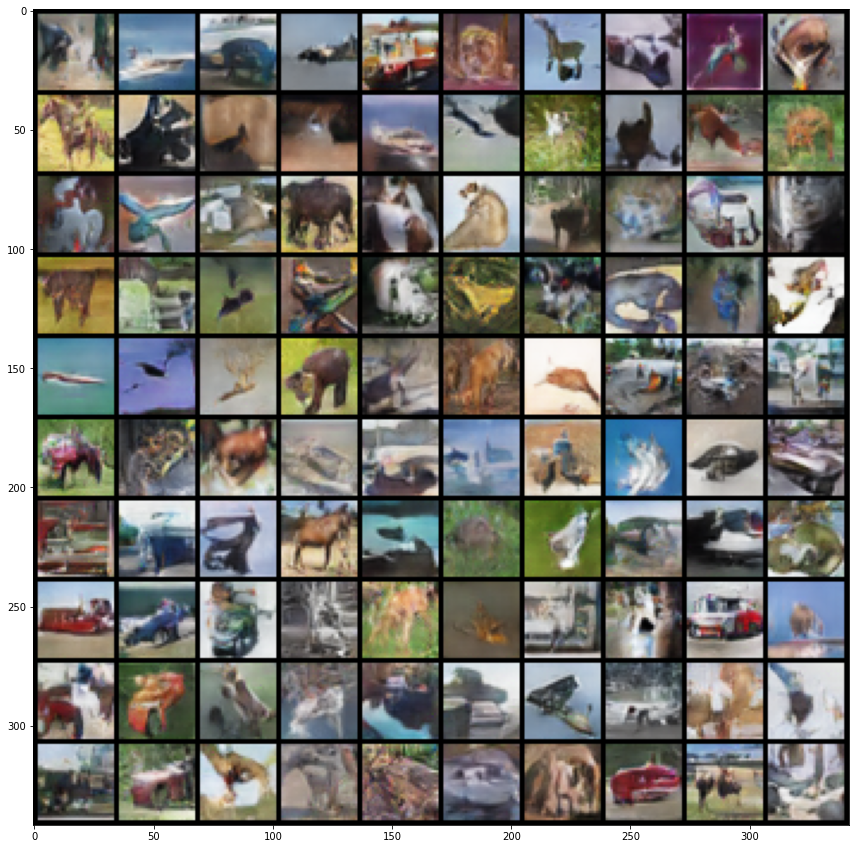

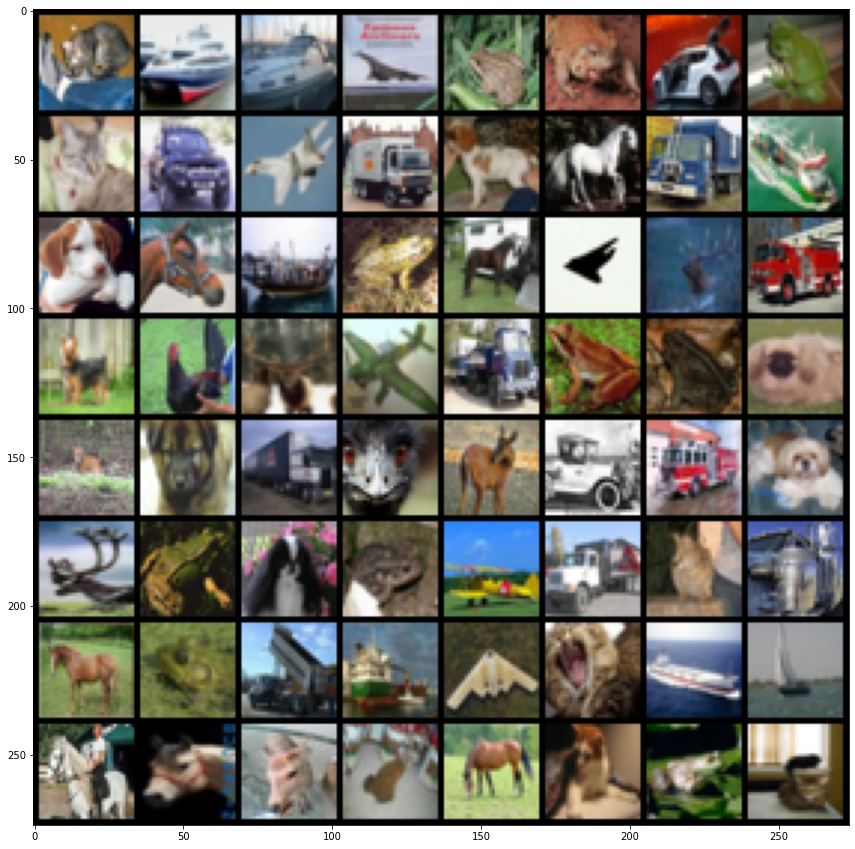

In [ ]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated,'/content/drive/MyDrive/icl_dl_cw2/CW_GAN/Teaching30final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices

First I have implemented the DCGAN model (https://arxiv.org/pdf/1511.06434.pdf), I chose to use ConvTranspose2D for the upsampling and small receptive fields. I have directly tried to train it but I had a bad image generation (level 0 or worse). I found out that I didn't have enough convolutional layers, so I have added layers for G and D.
Then I have tried different activation functions: Tanh, ReLU and LeakyReLU and I had better results using the last one (as suggested in the text).

After that I had to tune the hyperparameters (especially learning rate and the size of the feature map which the factor determining the size of the layers)  so I used randomized search and found the best values for my model.

After the previous step I had a pretty decent image generation, but I decided to implement another model: the Wasserstein GAN. I tried to use the article (https://arxiv.org/pdf/1701.07875.pdf) to implement it but I had a lot of issues and in the end I ended up with a poorer image generation and I did not find the cause.

If I had more time I would have implemented a Conditionnal GAN and added label smoothing, I saw articles about it and the results were impressive.

## Part 2.2: Understanding GAN Training

### Loss Curves


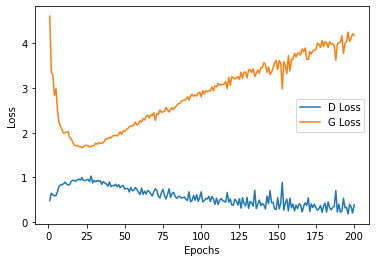

In [ ]:
X = np.arange(1, num_epochs + 1)
plt.plot(X, train_losses_D, label="D Loss")
plt.plot(X, train_losses_G, label='G Loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Part 2.3: Mode Collapse


### Discussion


Mode collapse happends when the generator provides only a limited sample variety. The collapse can not be total but partial. This can results in some images looking similar. Mode collapse can occur because the generator is never forced to cover all modes (poor diversity of generated samples), which triggers th discriminator.

For my first DCGAN, I noticed I had mode collapse issues and I have added convolutionnal layers as well as **increasing the latent dimension** to reduce mode collapse. It worked pretty well.

But to totally get rid of mode collapse, a more in depth dimensionnal study (size of encoder and latent space) would be interesting.



# Test Cell


In [ ]:
# If you want to run these tests yourself, change directory:
# !cd /content/drive/MyDrive/icl_dl_cw2/

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

#def gan_denorm(x):
    return x

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    x = 0.5 * (x + 1)
    x = x.clamp(0, 1)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST("./data/", train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

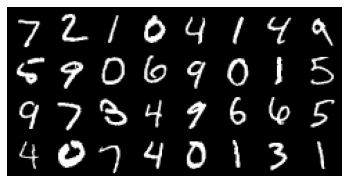

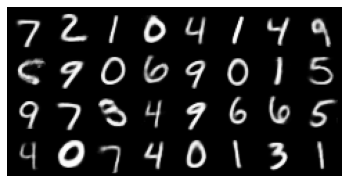

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./drive/MyDrive/icl_dl_cw2/CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional

for module in vae.children():
    for layer in module.children():
        if "Conv2d" in layer.original_name:
            print("Used Convs")
            break

vae_in = make_grid(denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_test = vae_test.view(32, 1, 28, 28)
vae_reco = make_grid(denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Number of Parameters is 4111872 which is ok


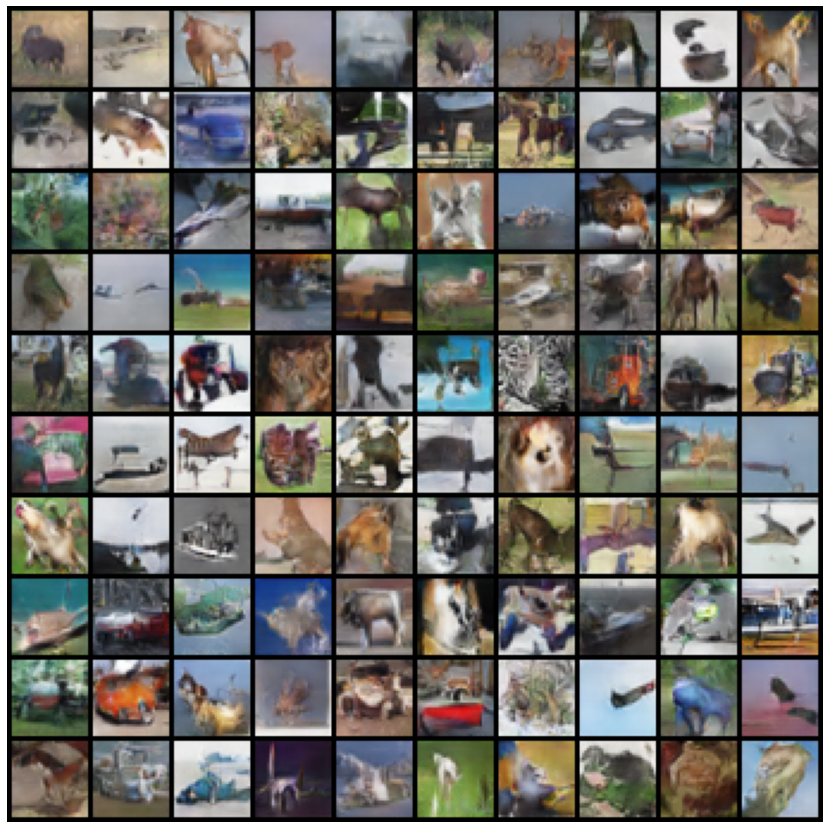

In [ ]:
# GAN Tests

#model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
#model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')

model_G = torch.jit.load('./drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./drive/MyDrive/icl_dl_cw2/CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)